In [1]:
import pandas as pd
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
%matplotlib inline
import seaborn as sns
import pandas as pd
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [2]:
df=pd.read_csv('file:///F:/CardioGoodFitness.csv')
df.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles
0,TM195,18,Male,14,Single,3,4,29562,112
1,TM195,19,Male,15,Single,2,3,31836,75
2,TM195,19,Female,14,Partnered,4,3,30699,66
3,TM195,19,Male,12,Single,3,3,32973,85
4,TM195,20,Male,13,Partnered,4,2,35247,47


In [4]:
df.shape

(180, 9)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Product        180 non-null    object
 1   Age            180 non-null    int64 
 2   Gender         180 non-null    object
 3   Education      180 non-null    int64 
 4   MaritalStatus  180 non-null    object
 5   Usage          180 non-null    int64 
 6   Fitness        180 non-null    int64 
 7   Income         180 non-null    int64 
 8   Miles          180 non-null    int64 
dtypes: int64(6), object(3)
memory usage: 12.8+ KB


In [6]:
df.dtypes

Product          object
Age               int64
Gender           object
Education         int64
MaritalStatus    object
Usage             int64
Fitness           int64
Income            int64
Miles             int64
dtype: object

In [7]:
df.corr()

,Age,Education,Usage,Fitness,Income,Miles
Age,1.000000,0.280496,0.015064,0.061105,0.513414,0.036618
Education,0.280496,1.000000,0.395155,0.410581,0.625827,0.307284
Usage,0.015064,0.395155,1.000000,0.668606,0.519537,0.759130
Fitness,0.061105,0.410581,0.668606,1.000000,0.535005,0.785702
Income,0.513414,0.625827,0.519537,0.535005,1.000000,0.543473
Miles,0.036618,0.307284,0.759130,0.785702,0.543473,1.000000


In [8]:
df.describe()

,Age,Education,Usage,Fitness,Income,Miles
count,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000
mean,28.788889,15.572222,3.455556,3.311111,53719.577778,103.194444
std,6.943498,1.617055,1.084797,0.958869,16506.684226,51.863605
min,18.000000,12.000000,2.000000,1.000000,29562.000000,21.000000
25%,24.000000,14.000000,3.000000,3.000000,44058.750000,66.000000
50%,26.000000,16.000000,3.000000,3.000000,50596.500000,94.000000
75%,33.000000,16.000000,4.000000,4.000000,58668.000000,114.750000
max,50.000000,21.000000,7.000000,5.000000,104581.000000,360.000000


In [9]:
df.corr().describe()

,Age,Education,Usage,Fitness,Income,Miles
count,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000
mean,0.317783,0.503224,0.559582,0.576833,0.622876,0.572035
std,0.385138,0.272059,0.337880,0.324495,0.189166,0.352532
min,0.015064,0.280496,0.015064,0.061105,0.513414,0.036618
25%,0.042739,0.329252,0.426251,0.441687,0.523404,0.366332
50%,0.170800,0.402868,0.594071,0.601805,0.539239,0.651302
75%,0.455184,0.572016,0.736499,0.756428,0.605239,0.779059
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [10]:
df.isnull().sum()

Product          0
Age              0
Gender           0
Education        0
MaritalStatus    0
Usage            0
Fitness          0
Income           0
Miles            0
dtype: int64

In [11]:
df.Product= df["Product"].astype("category")
df.Gender=df["Gender"].astype("category")
df.MaritalStatus=df["MaritalStatus"].astype("category")

In [12]:
df.Product.value_counts()

TM195    80
TM498    60
TM798    40
Name: Product, dtype: int64

In [13]:
df[df['Product']=='TM195'].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,80.0,28.5500,7.221452,18.0,23.0,26.0,33.0,50.0
Education,80.0,15.0375,1.216383,12.0,14.0,16.0,16.0,18.0
Usage,80.0,3.0875,0.782624,2.0,3.0,3.0,4.0,5.0
Fitness,80.0,2.9625,0.664540,1.0,3.0,3.0,3.0,5.0
Income,80.0,46418.0250,9075.783190,29562.0,38658.0,46617.0,53439.0,68220.0
Miles,80.0,82.7875,28.874102,38.0,66.0,85.0,94.0,188.0


In [14]:
df[df['Product']=='TM498'].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,60.0,28.900000,6.645248,19.0,24.0,26.0,33.25,48.0
Education,60.0,15.116667,1.222552,12.0,14.0,16.0,16.00,18.0
Usage,60.0,3.066667,0.799717,2.0,3.0,3.0,3.25,5.0
Fitness,60.0,2.900000,0.629770,1.0,3.0,3.0,3.00,4.0
Income,60.0,48973.650000,8653.989388,31836.0,44911.5,49459.5,53439.00,67083.0
Miles,60.0,87.933333,33.263135,21.0,64.0,85.0,106.00,212.0


In [15]:
df[df['Product']=='TM798'].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,40.0,29.100,6.971738,22.0,24.75,27.0,30.25,48.0
Education,40.0,17.325,1.639066,14.0,16.00,18.0,18.00,21.0
Usage,40.0,4.775,0.946993,3.0,4.00,5.0,5.00,7.0
Fitness,40.0,4.625,0.667467,3.0,4.00,5.0,5.00,5.0
Income,40.0,75441.575,18505.836720,48556.0,58204.75,76568.5,90886.00,104581.0
Miles,40.0,166.900,60.066544,80.0,120.00,160.0,200.00,360.0


In [16]:
df.Gender.value_counts()

Male      104
Female     76
Name: Gender, dtype: int64

In [17]:
df.MaritalStatus.value_counts()   

Partnered    107
Single        73
Name: MaritalStatus, dtype: int64

In [18]:
pd.crosstab(df['Gender'], df['Product'])

Product,TM195,TM498,TM798
Gender,,,
Female,40,29,7
Male,40,31,33


In [19]:
pd.crosstab(df['Fitness'], df['Product'])

Product,TM195,TM498,TM798
Fitness,,,
1,1,1,0
2,14,12,0
3,54,39,4
4,9,8,7
5,2,0,29


In [24]:
df.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles
0,TM195,18,Male,14,Single,3,4,29562,112
1,TM195,19,Male,15,Single,2,3,31836,75
2,TM195,19,Female,14,Partnered,4,3,30699,66
3,TM195,19,Male,12,Single,3,3,32973,85
4,TM195,20,Male,13,Partnered,4,2,35247,47


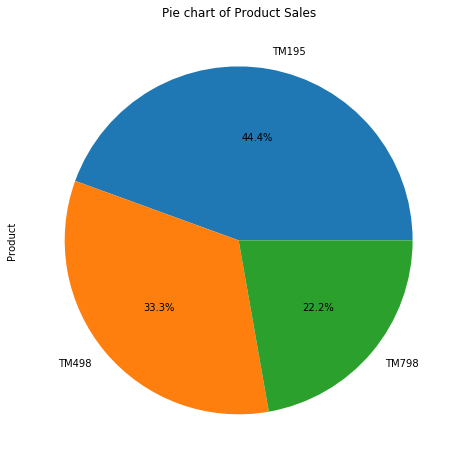

In [20]:
#Univariate Analysis
plt.figure(figsize=(15,8))
df['Product'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(8,8))
plt.title("Pie chart of Product Sales")
plt.show()

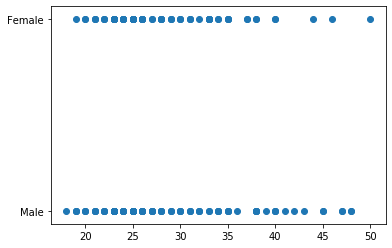

In [23]:
plt.scatter(df[['Age']],df['Gender'])

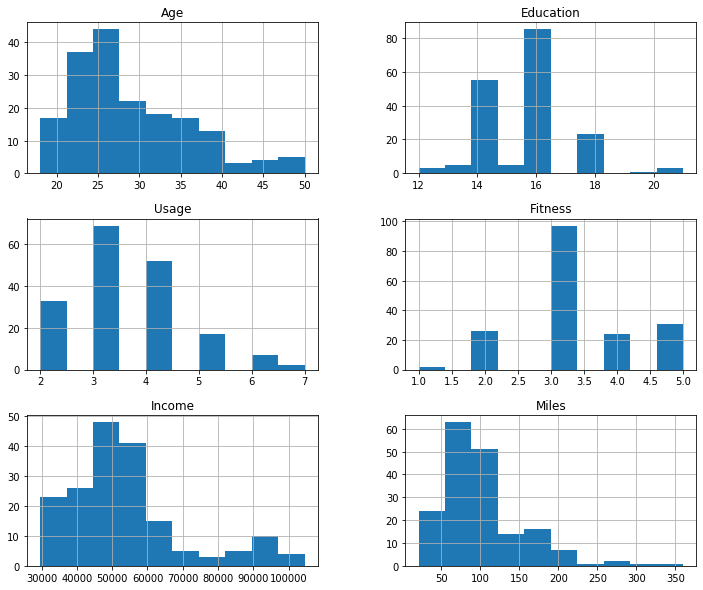

In [25]:
df.hist(figsize=(12,10))
plt.show()

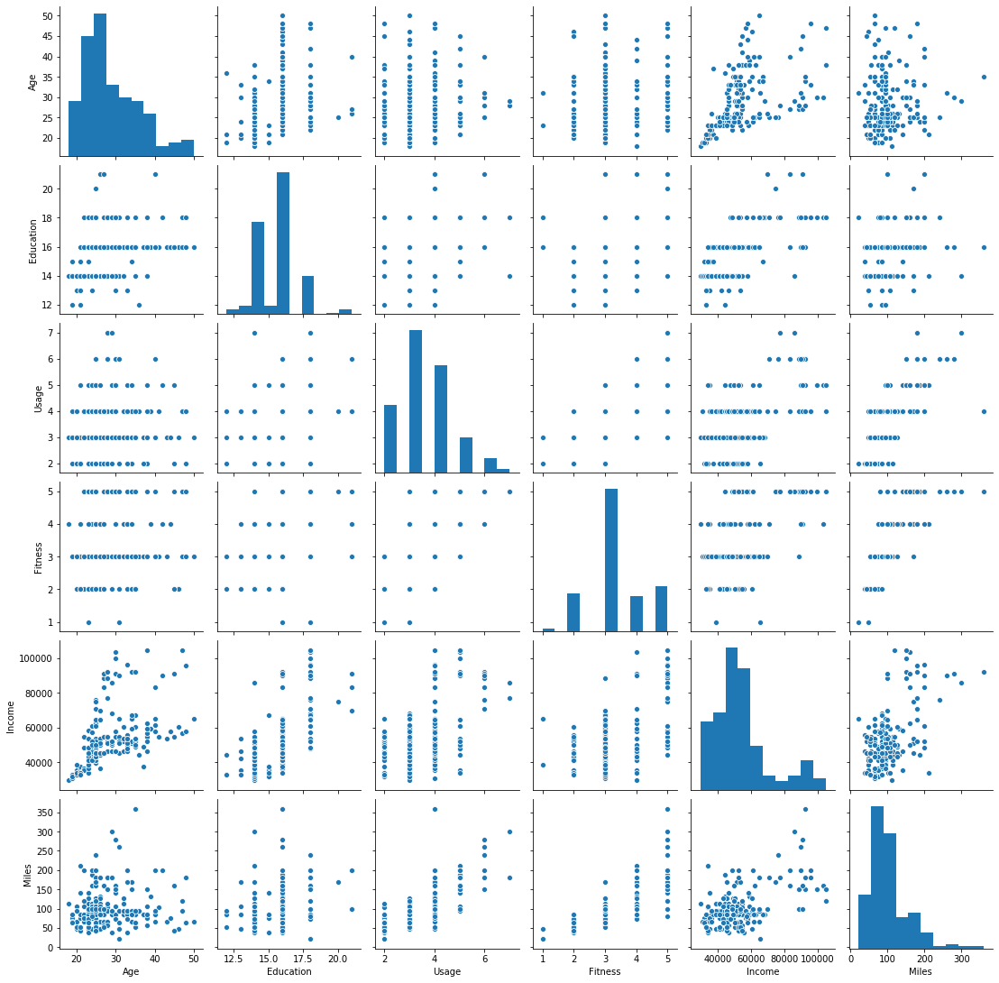

In [26]:
sns.pairplot(df)

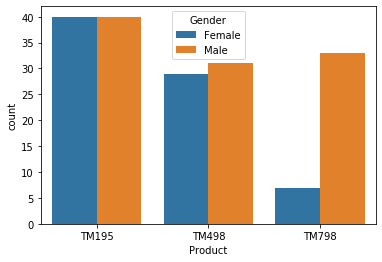

In [27]:
sns.countplot(x='Product', hue='Gender', data=df)

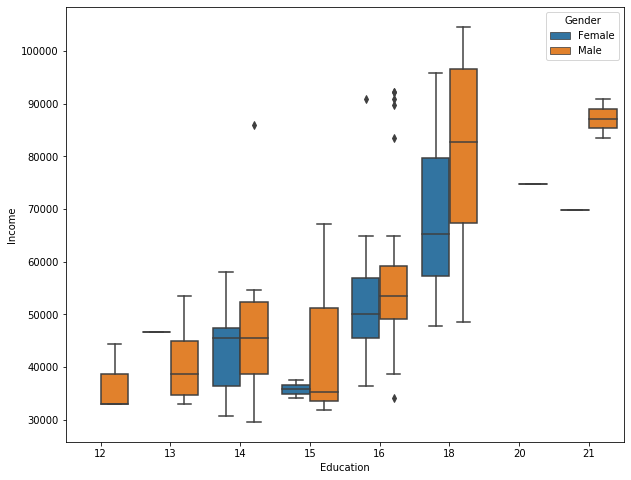

In [32]:
plt.figure(figsize=(10,8))
sns.boxplot(x='Education',y='Income',data=df,hue='Gender')

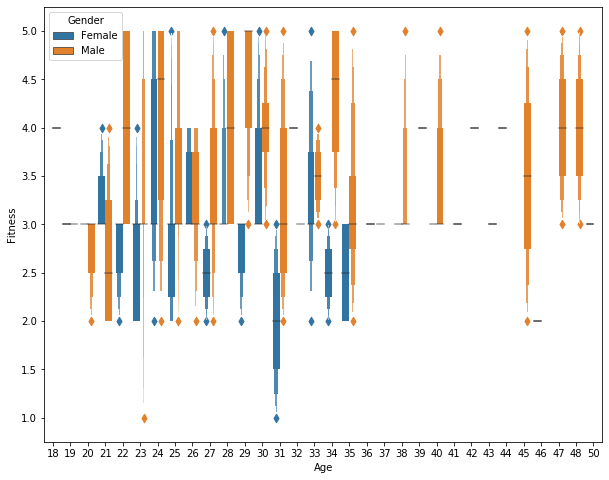

In [31]:
plt.figure(figsize=(10,8))
sns.boxenplot(x='Age',y='Fitness',data=df,hue='Gender')

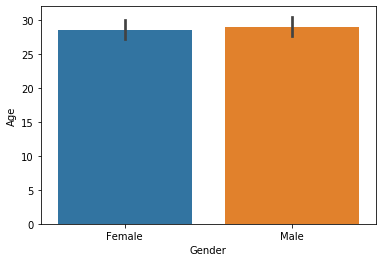

In [35]:
sns.barplot(x='Gender',y='Age',data=df)

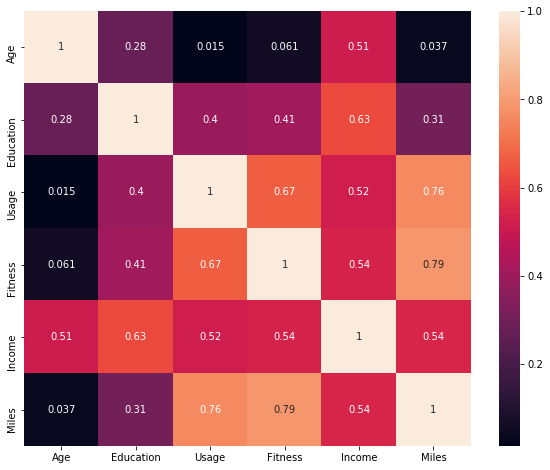

In [36]:
plt.figure(figsize = (10,8))
sns.heatmap(df.corr(), annot = True)

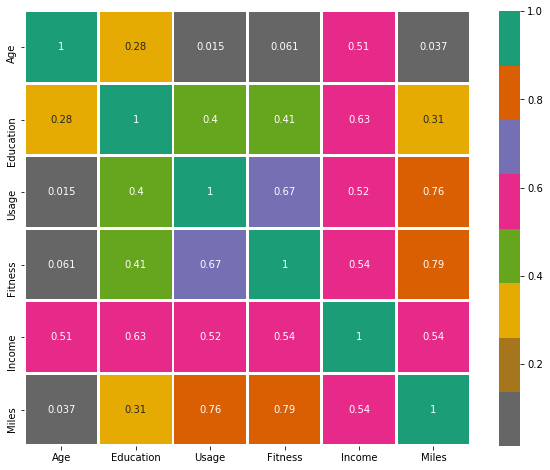

In [37]:
plt.figure(figsize = (10,8))
sns.heatmap(df.corr(),annot=True,cmap='Dark2_r',linewidths=2)
plt.show()

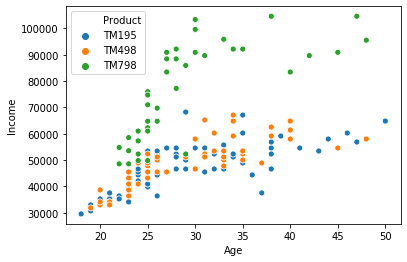

In [38]:
sns.scatterplot(x='Age', y='Income', hue='Product', data=df)

<Figure size 864x504 with 0 Axes>

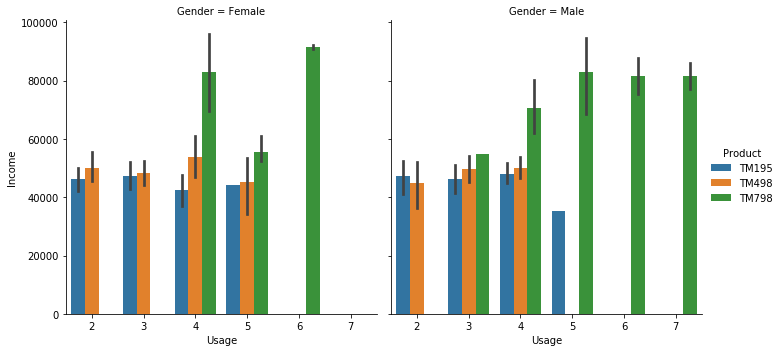

In [39]:
plt.figure(figsize=(12,7))
sns.catplot(x='Usage', y='Income', col='Gender',hue='Product' ,kind="bar", data=df) 

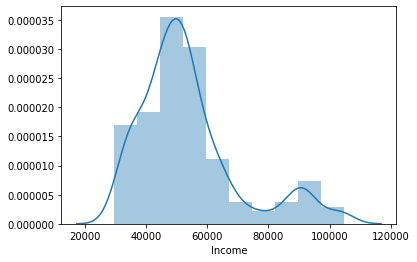

In [41]:
sns.distplot(df['Income'],bins=10)

<Figure size 720x576 with 0 Axes>

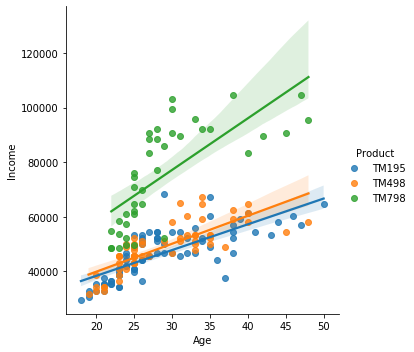

In [45]:
plt.figure(figsize=(10,8))
sns.lmplot(x="Age", y="Income",hue='Product',
data=df)

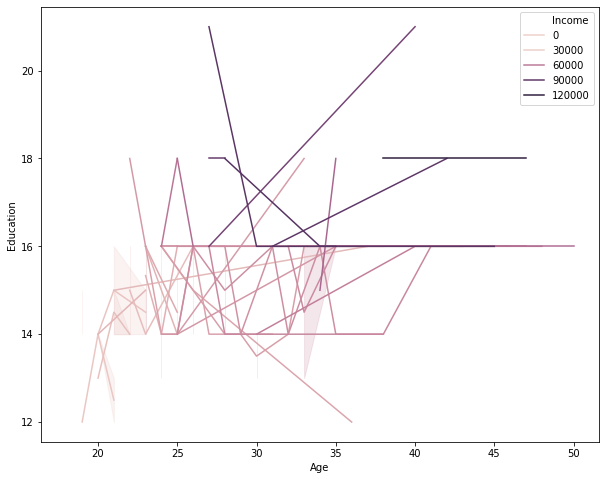

In [46]:
plt.figure(figsize=(10,8))
sns.lineplot(x="Age", y="Education",hue='Income',
data=df)

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


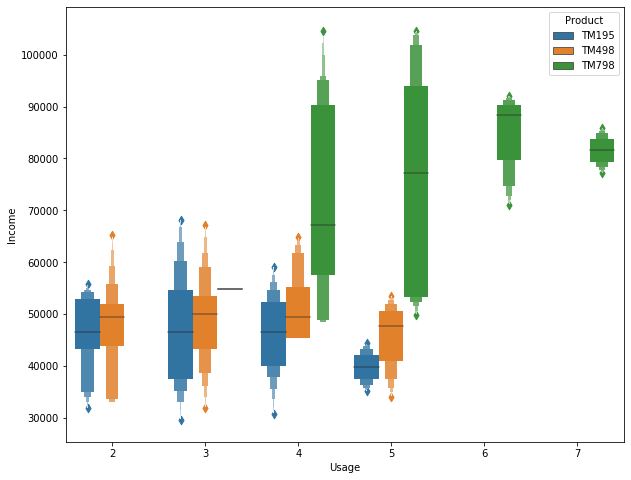

In [47]:
plt.figure(figsize=(10,8))
sns.lvplot(x="Usage", y="Income",hue='Product',
data=df)

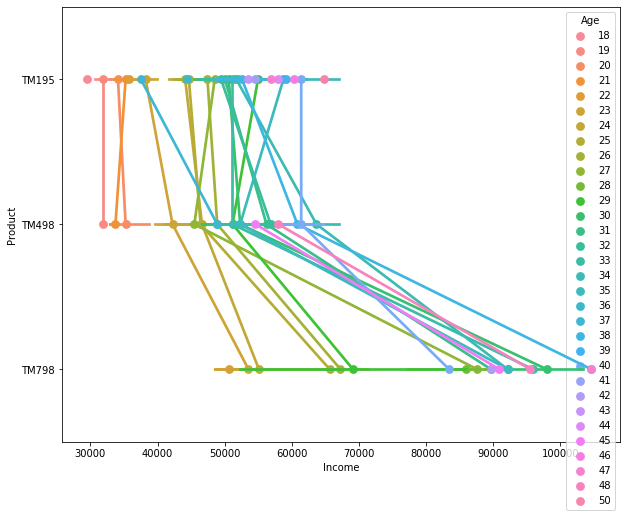

In [48]:
plt.figure(figsize=(10,8))
sns.pointplot(x="Income", y="Product",hue='Age',
data=df)

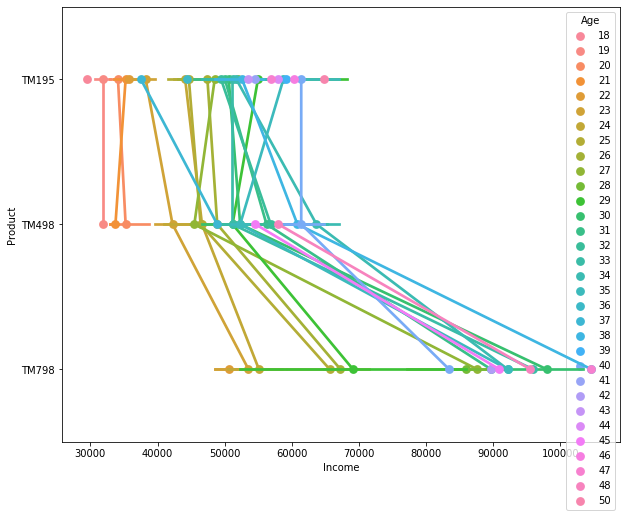

In [50]:
plt.figure(figsize=(10,8))
sns.pointplot(x="Income", y="Product",hue='Age',
data=df)

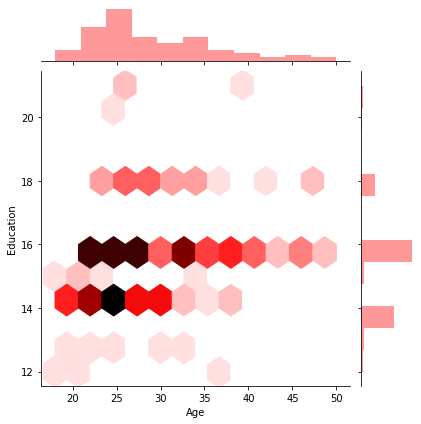

In [51]:
sns.jointplot(x = 'Age',y = 'Education',data = df,color="red",kind='hex')

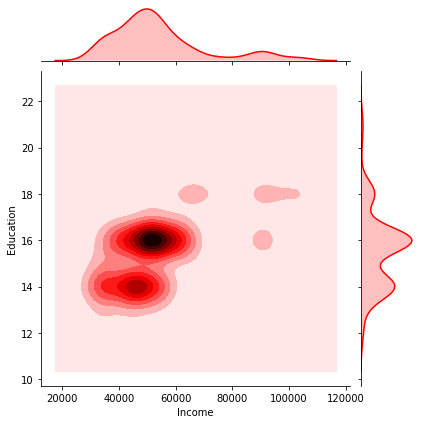

In [52]:
sns.jointplot(x = 'Income',y = 'Education',data = df,color="red",kind='kde')

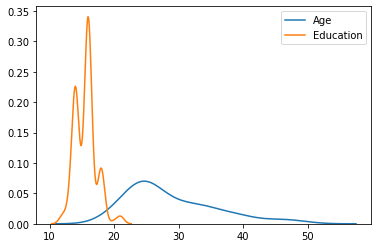

In [55]:
sns.kdeplot(df['Age'])
sns.kdeplot(df['Education'])

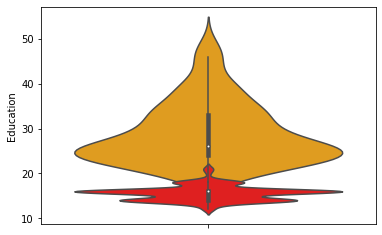

In [58]:
#sns.violinplot(y="Income",data=df)
sns.violinplot(y="Age",data=df,color='orange')
sns.violinplot(y="Education",data=df,color='red')

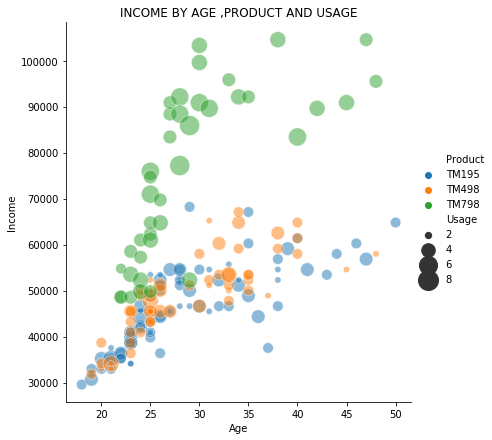

In [59]:
#scatter plot between income, age ,product and usage
sns.relplot(x="Age", y="Income", hue="Product", size="Usage",
            sizes=(40, 400), alpha=.5,
            height=6, data=df).set(title='INCOME BY AGE ,PRODUCT AND USAGE');

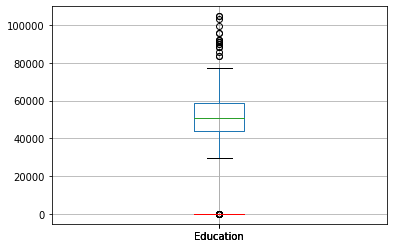

In [61]:
df.boxplot(column="Income")
df.boxplot(column="Age",color='orange')
df.boxplot(column="Education",color='red')

In [62]:
import plotly.express as px

In [63]:
fig = px.treemap(df.groupby('Education').Income.sum().reset_index(), 
                 path=['Education'], values='Income',
                  color='Income', hover_data=['Education'],
                  title="Education by Income",
                  color_continuous_scale='RdBu')
fig.show()

In [64]:
import sweetviz as sv

In [66]:
data=sv.analyze(df)
data.show_html('Analyze.html')

                                             |                                             | [  0%]   00:00 ->…

Report Analyze.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [67]:
from IPython.display import IFrame

In [68]:
IFrame(src='Analyze.html',width=1000,height=600)

In [69]:
from dataprep.eda import *

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\dask\dataframe\accessor.py:48: FutureWarning:

The default value of regex will change from True to False in a future version.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\dask\dataframe\accessor.py:48: FutureWarning:

The default value of regex will change from True to False in a future version.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\dask\dataframe\accessor.py:48: FutureWarning:

The default value of regex will change from True to False in a future version.



  0%|                                                                                         | 0/1080 [00:00<…

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\dask\dataframe\accessor.py:48: FutureWarning:

The default value of regex will change from True to False in a future version.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\dask\dataframe\accessor.py:48: FutureWarning:

The default value of regex will change from True to False in a future version.



DataPrep Report
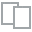
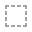
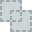
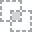
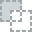
...
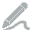
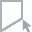
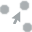
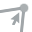
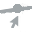

In [70]:
create_report(df)

In [71]:
df.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles
0,TM195,18,Male,14,Single,3,4,29562,112
1,TM195,19,Male,15,Single,2,3,31836,75
2,TM195,19,Female,14,Partnered,4,3,30699,66
3,TM195,19,Male,12,Single,3,3,32973,85
4,TM195,20,Male,13,Partnered,4,2,35247,47


In [72]:
gender={'Female:0',"Male:1"}

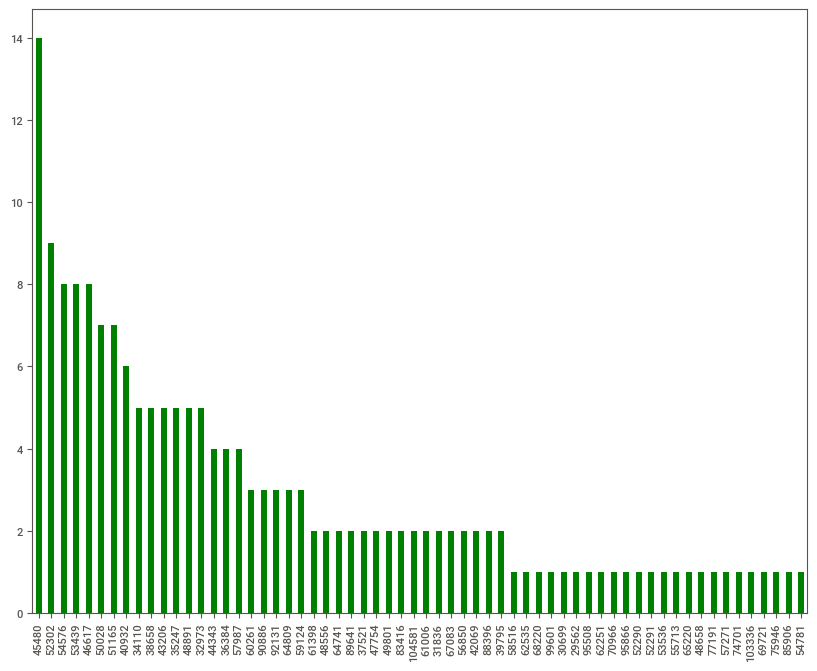

In [78]:
plt.figure(figsize=(10,8))
df.Income.value_counts().plot(kind='bar',color='g')

In [80]:
just_numarical=df.select_dtypes(exclude=['object'].copy())
just_numarical

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles
0,TM195,18,Male,14,Single,3,4,29562,112
1,TM195,19,Male,15,Single,2,3,31836,75
2,TM195,19,Female,14,Partnered,4,3,30699,66
3,TM195,19,Male,12,Single,3,3,32973,85
4,TM195,20,Male,13,Partnered,4,2,35247,47
...,...,...,...,...,...,...,...,...,...
175,TM798,40,Male,21,Single,6,5,83416,200
176,TM798,42,Male,18,Single,5,4,89641,200
177,TM798,45,Male,16,Single,5,5,90886,160
178,TM798,47,Male,18,Partnered,4,5,104581,120


In [82]:
df.columns

Index(['Product', 'Age', 'Gender', 'Education', 'MaritalStatus', 'Usage',
       'Fitness', 'Income', 'Miles'],
      dtype='object')

In [81]:
from sklearn.preprocessing import LabelEncoder

In [83]:
le=LabelEncoder()
df_col=( 'Gender', 'MaritalStatus')
for i in df_col:
    df[i]=le.fit_transform(df[i])

In [84]:
df.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles
0,TM195,18,1,14,1,3,4,29562,112
1,TM195,19,1,15,1,2,3,31836,75
2,TM195,19,0,14,0,4,3,30699,66
3,TM195,19,1,12,1,3,3,32973,85
4,TM195,20,1,13,0,4,2,35247,47


In [85]:
x=df.Education.values
y=df.Income.values

In [86]:
x=x.reshape(-1,1)

In [87]:
y=y.reshape(-1,1)

In [88]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3)

In [94]:
tre=DecisionTreeClassifier()
tre.fit(xtrain,ytrain)
pred_tre=tre.predict(xtest)
accu_tre=accuracy_score(ytest , pred_tre)*1000
accu_tre

92.59259259259258

In [90]:
print(classification_report(ytest,pred_tre))

              precision    recall  f1-score   support

       32973       0.00      0.00      0.00         2
       34110       0.00      0.00      0.00         1
       35247       0.00      0.00      0.00         1
       36384       0.00      0.00      0.00         1
       38658       0.00      0.00      0.00         3
       39795       0.00      0.00      0.00         1
       40932       0.00      0.00      0.00         1
       43206       0.00      0.00      0.00         4
       44343       0.00      0.00      0.00         2
       45480       0.31      0.57      0.40         7
       46617       0.00      0.00      0.00         2
       47754       0.00      0.00      0.00         1
       48658       0.00      0.00      0.00         1
       50028       0.03      1.00      0.06         1
       52302       0.00      0.00      0.00         3
       53439       0.00      0.00      0.00         2
       54576       0.00      0.00      0.00         2
       56850       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [91]:
from sklearn.neighbors import KNeighborsClassifier

In [93]:
kne=KNeighborsClassifier()
kne.fit(xtrain,ytrain)
pred_kne=kne.predict(xtest)
accu_kne=accuracy_score(ytest , pred_tre)*1000
accu_kne

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



92.59259259259258

In [95]:
print(classification_report(ytest,pred_kne))

              precision    recall  f1-score   support

       32973       0.00      0.00      0.00         2
       34110       0.00      0.00      0.00         1
       35247       0.00      0.00      0.00         1
       36384       0.00      0.00      0.00         1
       38658       0.00      0.00      0.00         3
       39795       0.00      0.00      0.00         1
       40932       0.03      1.00      0.06         1
       43206       0.00      0.00      0.00         4
       44343       0.00      0.00      0.00         2
       45480       0.00      0.00      0.00         7
       46617       0.00      0.00      0.00         2
       47754       0.00      0.00      0.00         1
       48658       0.00      0.00      0.00         1
       50028       0.00      0.00      0.00         1
       52302       0.00      0.00      0.00         3
       53439       0.00      0.00      0.00         2
       54576       0.00      0.00      0.00         2
       56850       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [96]:
from sklearn.ensemble import AdaBoostClassifier

In [98]:
ada=AdaBoostClassifier()
ada.fit(xtrain,ytrain)
pred_ada=ada.predict(xtest)
accu_ada=accuracy_score(ytest , pred_ada)*1000
accu_ada

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



92.59259259259258

In [99]:
print(classification_report(ytest,pred_ada))

              precision    recall  f1-score   support

       32973       0.00      0.00      0.00         2
       34110       0.00      0.00      0.00         1
       35247       0.00      0.00      0.00         1
       36384       0.00      0.00      0.00         1
       38658       0.00      0.00      0.00         3
       39795       0.00      0.00      0.00         1
       40932       0.00      0.00      0.00         1
       43206       0.00      0.00      0.00         4
       44343       0.00      0.00      0.00         2
       45480       0.29      0.57      0.38         7
       46617       0.00      0.00      0.00         2
       47754       0.00      0.00      0.00         1
       48556       0.00      0.00      0.00         0
       48658       0.00      0.00      0.00         1
       50028       0.03      1.00      0.06         1
       52302       0.00      0.00      0.00         3
       53439       0.00      0.00      0.00         2
       54576       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [100]:
from sklearn.ensemble import BaggingClassifier

In [101]:
bag=BaggingClassifier()
bag.fit(xtrain,ytrain)
pred_bag=bag.predict(xtest)
accu_bag=accuracy_score(ytest , pred_bag)*1000
accu_bag

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\ensemble\_bagging.py:645: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



74.07407407407408

In [102]:
print(classification_report(ytest,pred_bag))

              precision    recall  f1-score   support

       32973       0.00      0.00      0.00         2
       34110       0.00      0.00      0.00         1
       35247       0.00      0.00      0.00         1
       36384       0.00      0.00      0.00         1
       38658       0.00      0.00      0.00         3
       39795       0.00      0.00      0.00         1
       40932       0.00      0.00      0.00         1
       43206       0.00      0.00      0.00         4
       44343       0.00      0.00      0.00         2
       45480       0.31      0.57      0.40         7
       46617       0.00      0.00      0.00         2
       47754       0.00      0.00      0.00         1
       48556       0.00      0.00      0.00         0
       48658       0.00      0.00      0.00         1
       50028       0.00      0.00      0.00         1
       51165       0.00      0.00      0.00         0
       52302       0.00      0.00      0.00         3
       53439       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [103]:
from sklearn.svm import SVC

In [105]:
svc=SVC()
svc.fit(xtrain,ytrain)
pre_siv=svc.predict(xtest)
accu_l=accuracy_score(ytest,pre_siv)*1000
accu_l

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



74.07407407407408

In [106]:
print(classification_report(ytest,pre_siv))

              precision    recall  f1-score   support

       32973       0.00      0.00      0.00         2
       34110       0.00      0.00      0.00         1
       35247       0.00      0.00      0.00         1
       36384       0.00      0.00      0.00         1
       38658       0.00      0.00      0.00         3
       39795       0.00      0.00      0.00         1
       40932       0.00      0.00      0.00         1
       43206       0.00      0.00      0.00         4
       44343       0.00      0.00      0.00         2
       45480       0.31      0.57      0.40         7
       46617       0.00      0.00      0.00         2
       47754       0.00      0.00      0.00         1
       48658       0.00      0.00      0.00         1
       50028       0.00      0.00      0.00         1
       51165       0.00      0.00      0.00         0
       52302       0.00      0.00      0.00         3
       53439       0.00      0.00      0.00         2
       54576       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [107]:
from sklearn.naive_bayes import GaussianNB

In [108]:
gau=GaussianNB()
gau.fit(xtrain,ytrain)
pre_gau=gau.predict(xtest)
accu_l=accuracy_score(ytest,pre_gau)*1000
accu_l

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\naive_bayes.py:206: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



37.03703703703704

In [109]:
print(classification_report(ytest,pre_gau))

              precision    recall  f1-score   support

       32973       0.00      0.00      0.00         2
       34110       0.00      0.00      0.00         1
       35247       0.00      0.00      0.00         1
       36384       0.00      0.00      0.00         1
       38658       0.08      0.33      0.12         3
       39795       0.00      0.00      0.00         1
       40932       0.00      0.00      0.00         1
       43206       0.00      0.00      0.00         4
       44343       0.00      0.00      0.00         2
       45480       0.00      0.00      0.00         7
       46617       0.00      0.00      0.00         2
       47754       0.00      0.00      0.00         1
       48658       0.00      0.00      0.00         1
       50028       0.03      1.00      0.06         1
       52302       0.00      0.00      0.00         3
       53439       0.00      0.00      0.00         2
       54576       0.00      0.00      0.00         2
       56850       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [110]:
from sklearn.ensemble import AdaBoostClassifier

In [112]:
ada=AdaBoostClassifier()
#rdf=RandomForestClassifier()
ada.fit(xtrain,ytrain)
pre_ada=ada.predict(xtest)
accu_ada=accuracy_score(ytest,pre_ada)*1000
accu_ada

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



92.59259259259258

In [113]:
print(classification_report(ytest,pre_ada))

              precision    recall  f1-score   support

       32973       0.00      0.00      0.00         2
       34110       0.00      0.00      0.00         1
       35247       0.00      0.00      0.00         1
       36384       0.00      0.00      0.00         1
       38658       0.00      0.00      0.00         3
       39795       0.00      0.00      0.00         1
       40932       0.00      0.00      0.00         1
       43206       0.00      0.00      0.00         4
       44343       0.00      0.00      0.00         2
       45480       0.29      0.57      0.38         7
       46617       0.00      0.00      0.00         2
       47754       0.00      0.00      0.00         1
       48556       0.00      0.00      0.00         0
       48658       0.00      0.00      0.00         1
       50028       0.03      1.00      0.06         1
       52302       0.00      0.00      0.00         3
       53439       0.00      0.00      0.00         2
       54576       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [114]:
from sklearn.ensemble import GradientBoostingClassifier

In [116]:
grd=GradientBoostingClassifier()
grd.fit(xtrain,ytrain)
pre_grd=grd.predict(xtest)
accu_grd=accuracy_score(ytest,pre_ada)*1000
accu_grd

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:1454: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



92.59259259259258

In [117]:
print(classification_report(ytest,pre_grd))

              precision    recall  f1-score   support

       32973       0.00      0.00      0.00         2
       34110       0.00      0.00      0.00         1
       35247       0.00      0.00      0.00         1
       36384       0.00      0.00      0.00         1
       38658       0.00      0.00      0.00         3
       39795       0.00      0.00      0.00         1
       40932       0.00      0.00      0.00         1
       43206       0.00      0.00      0.00         4
       44343       0.00      0.00      0.00         2
       45480       0.31      0.57      0.40         7
       46617       0.00      0.00      0.00         2
       47754       0.00      0.00      0.00         1
       48658       0.00      0.00      0.00         1
       50028       0.03      1.00      0.06         1
       52302       0.00      0.00      0.00         3
       53439       0.00      0.00      0.00         2
       54576       0.00      0.00      0.00         2
       56850       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [118]:
from sklearn.ensemble import ExtraTreesClassifier

In [119]:
etc=ExtraTreesClassifier()
etc.fit(xtrain,ytrain)
pre_etc=etc.predict(xtest)
accu_etc=accuracy_score(ytest,pre_etc)*1000
accu_etc

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



92.59259259259258

In [120]:
print(classification_report(ytest,pre_grd))

              precision    recall  f1-score   support

       32973       0.00      0.00      0.00         2
       34110       0.00      0.00      0.00         1
       35247       0.00      0.00      0.00         1
       36384       0.00      0.00      0.00         1
       38658       0.00      0.00      0.00         3
       39795       0.00      0.00      0.00         1
       40932       0.00      0.00      0.00         1
       43206       0.00      0.00      0.00         4
       44343       0.00      0.00      0.00         2
       45480       0.31      0.57      0.40         7
       46617       0.00      0.00      0.00         2
       47754       0.00      0.00      0.00         1
       48658       0.00      0.00      0.00         1
       50028       0.03      1.00      0.06         1
       52302       0.00      0.00      0.00         3
       53439       0.00      0.00      0.00         2
       54576       0.00      0.00      0.00         2
       56850       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [121]:
models = pd.DataFrame({
    'Model': ['DecisionTreeClassifier','RandomForestClassifier',  'KNeighborsClassifier',
             'AdaBoostClassifier','BaggingClassifier','SVC','GaussianNB','AdaBoostClassifier','GradientBoostingClassifier','ExtraTreesClassifier'],
    'Score': [ accu_tre,accu_l, accu_kne, accu_ada,accu_bag,accu_l,accu_l,accu_ada,accu_grd,accu_etc]
})

models.sort_values(by = 'Score', ascending = False)

,Model,Score
0,DecisionTreeClassifier,92.592593
2,KNeighborsClassifier,92.592593
3,AdaBoostClassifier,92.592593
7,AdaBoostClassifier,92.592593
8,GradientBoostingClassifier,92.592593
9,ExtraTreesClassifier,92.592593
4,BaggingClassifier,74.074074
1,RandomForestClassifier,37.037037
5,SVC,37.037037
6,GaussianNB,37.037037
